PJM Hourly Energy Consumption Data
PJM Interconnection LLC (PJM) is a regional transmission organization (RTO) in the United States. It is part of the Eastern Interconnection grid operating an electric transmission system serving all or parts of Delaware, Illinois, Indiana, Kentucky, Maryland, Michigan, New Jersey, North Carolina, Ohio, Pennsylvania, Tennessee, Virginia, West Virginia, and the District of Columbia.

The hourly power consumption data comes from PJM's website and are in megawatts (MW).

The regions have changed over the years so data may only appear for certain dates per region.


###  Hourly Energy Consumption Forecasting

In [1]:
import  matplotlib.pyplot as plt
plt.rcParams['figure.figsize']=(12,8)
import seaborn as sns
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
plt.style.use('ggplot')
from statsmodels.tsa.seasonal import seasonal_decompose
import  plotly.express as px
import holidays

In [2]:
data=pd.read_csv("C:\\Users\\nehas\\Dropbox\\PC\\Downloads\\PJMW_hourly(1).csv",parse_dates=['Datetime'],index_col='Datetime')
data.head()

,PJMW_MW
Datetime,
2002-12-31 01:00:00,5077.0
2002-12-31 02:00:00,4939.0
2002-12-31 03:00:00,4885.0
2002-12-31 04:00:00,4857.0
2002-12-31 05:00:00,4930.0


In [3]:
# createing a data clean function
def data_clean(df):
    df.sort_index(inplace = True)
    df = df[~df.index.duplicated()]
    df = df.asfreq('H')
    df.rename(columns = {'PJMW_MW' : 'energy'}, inplace = True)
    df.energy = df.energy.fillna(method = 'ffill')

    return df

In [4]:
data_1=data_clean(data)
data_1

,energy
Datetime,
2002-04-01 01:00:00,4374.0
2002-04-01 02:00:00,4306.0
2002-04-01 03:00:00,4322.0
2002-04-01 04:00:00,4359.0
2002-04-01 05:00:00,4436.0
...,...
2018-08-02 20:00:00,6545.0
2018-08-02 21:00:00,6496.0
2018-08-02 22:00:00,6325.0


 #### [ i ] EXPLORATORY DATA ANALYSIS 

In [5]:
data_1['energy'].duplicated().sum()

137889

In [6]:
data_1.shape

(143232, 1)

In [7]:
data_1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 143232 entries, 2002-04-01 01:00:00 to 2018-08-03 00:00:00
Freq: H
Data columns (total 1 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   energy  143232 non-null  float64
dtypes: float64(1)
memory usage: 2.2 MB


In [8]:
data_1.isnull().sum()

energy    0
dtype: int64

In [9]:
data_1.describe()

,energy
count,143232.000000
mean,5602.227805
std,979.165847
min,487.000000
25%,4906.000000
50%,5530.000000
75%,6252.000000
max,9594.000000


### FEATURE EXTRACTION

In [10]:
def data_prep(df):
    df['date']=df.index.date
    df['year'] = df.index.year
    df['month'] = df.index.month
    df['month_name'] = df.index.month_name()
    df['week_of_year'] = df.index.weekofyear
    df['quarter'] = df.index.quarter
    df['day_of_week'] = df.index.dayofweek
    df['day_of_week_name'] = df.index.day_name()
    df['day_of_month'] = df.index.day
    df['day_of_year'] = df.index.dayofyear
    df['hour'] = df.index.hour
    df['time']=df.index.time
    
    return df

In [11]:
data_prep(data_1)

,energy,date,year,month,month_name,week_of_year,quarter,day_of_week,day_of_week_name,day_of_month,day_of_year,hour,time
Datetime,,,,,,,,,,,,,
2002-04-01 01:00:00,4374.0,2002-04-01,2002,4,April,14,2,0,Monday,1,91,1,01:00:00
2002-04-01 02:00:00,4306.0,2002-04-01,2002,4,April,14,2,0,Monday,1,91,2,02:00:00
2002-04-01 03:00:00,4322.0,2002-04-01,2002,4,April,14,2,0,Monday,1,91,3,03:00:00
2002-04-01 04:00:00,4359.0,2002-04-01,2002,4,April,14,2,0,Monday,1,91,4,04:00:00
2002-04-01 05:00:00,4436.0,2002-04-01,2002,4,April,14,2,0,Monday,1,91,5,05:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-02 20:00:00,6545.0,2018-08-02,2018,8,August,31,3,3,Thursday,2,214,20,20:00:00
2018-08-02 21:00:00,6496.0,2018-08-02,2018,8,August,31,3,3,Thursday,2,214,21,21:00:00
2018-08-02 22:00:00,6325.0,2018-08-02,2018,8,August,31,3,3,Thursday,2,214,22,22:00:00


### Outlier Detection 

### Using Standard Deviation Method to Detect the outliers 

In [12]:
def out_std(df, column):
    global lower,upper
    # mean & std
    data_mean, data_std = df[column].mean(), df[column].std()
    # cuoff value
    cut_off = data_std * 3
    # lower and upper bound value
    lower, upper = data_mean - cut_off, data_mean + cut_off
    print('The lower bound value is', lower)
    print('The upper bound value is', upper)
    #  number of records below and above lower and above bound value respectively
    df1 = df[df[column] > upper]
    df2 = df[df[column] < lower]
    return print('Total number of outliers are', df1.shape[0]+ df2.shape[0])

In [13]:
out_std(data_1,'energy')

The lower bound value is 2664.7302649432722
The upper bound value is 8539.725345534833
Total number of outliers are 298


In [14]:
Outliers=data_1[(data_1['energy']<lower)|(data_1['energy']>upper)]
Outliers

,energy,date,year,month,month_name,week_of_year,quarter,day_of_week,day_of_week_name,day_of_month,day_of_year,hour,time
Datetime,,,,,,,,,,,,,
2003-05-29 00:00:00,487.0,2003-05-29,2003,5,May,22,2,3,Thursday,29,149,0,00:00:00
2004-12-20 19:00:00,8598.0,2004-12-20,2004,12,December,52,4,0,Monday,20,355,19,19:00:00
2004-12-20 20:00:00,8574.0,2004-12-20,2004,12,December,52,4,0,Monday,20,355,20,20:00:00
2005-01-17 19:00:00,8561.0,2005-01-17,2005,1,January,3,1,0,Monday,17,17,19,19:00:00
2005-01-24 13:00:00,8742.0,2005-01-24,2005,1,January,4,1,0,Monday,24,24,13,13:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-01-07 08:00:00,8780.0,2018-01-07,2018,1,January,1,1,6,Sunday,7,7,8,08:00:00
2018-01-07 09:00:00,8846.0,2018-01-07,2018,1,January,1,1,6,Sunday,7,7,9,09:00:00
2018-01-15 08:00:00,8626.0,2018-01-15,2018,1,January,3,1,0,Monday,15,15,8,08:00:00


### Boxplot on yearly basis to check the outliers

<AxesSubplot:xlabel='year', ylabel='energy'>

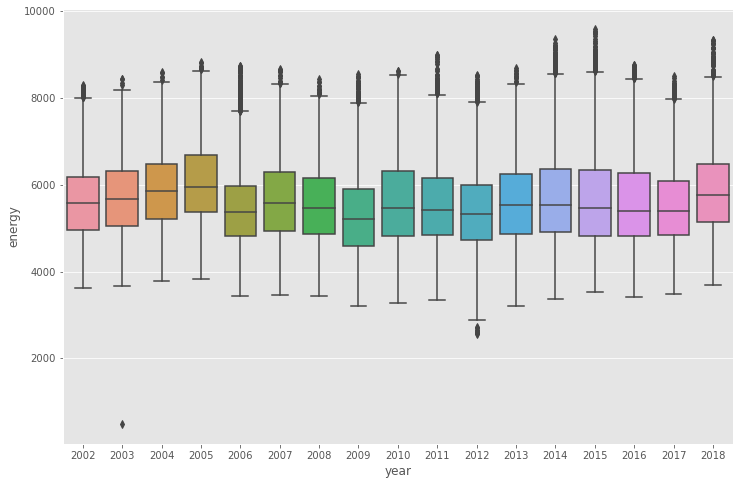

In [15]:
sns.boxplot(x=data_1['year'],y=data_1['energy'])

### Boxplot on whole data to check the outliers

<AxesSubplot:xlabel='energy'>

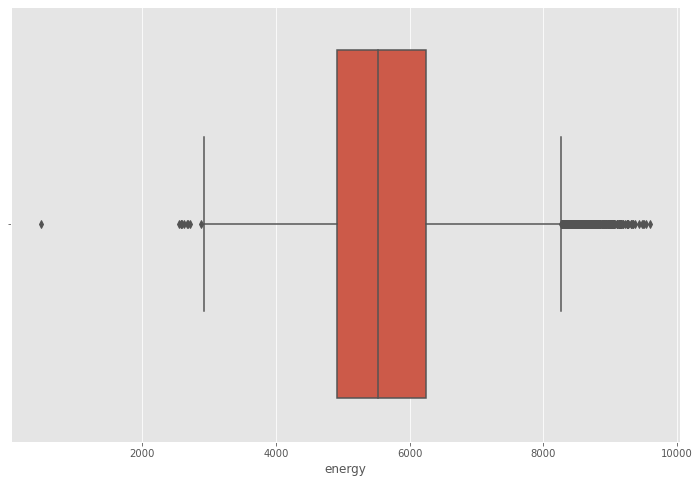

In [16]:
sns.boxplot(data_1['energy'])

### Now we will try to remove the outliers using IQR method

In [17]:
freq=data_1.groupby('year').agg({'energy':'mean'}).reset_index()

In [18]:
for col in range(2002,2019):
    year=data_1.loc[data_1['year']==col] 
    # Q1 n Q3 
    Q1=np.percentile(year['energy'],25,interpolation='midpoint')
    Q3=np.percentile(year['energy'],75,interpolation='midpoint')
    # IQR
    IQR=Q3-Q1
    s=1.5*IQR
    # upper n lower
    upper=Q3+s
    lower=Q1-s
    val=freq.loc[freq['year']==col]
    freq_i=val['energy'].values[0]
    data_1.loc[data_1['energy']>upper,'energy']=freq_i
    data_1.loc[data_1['energy']<lower,'energy']=freq_i

#### Now we will check whether the outliers removed or not

<AxesSubplot:xlabel='year', ylabel='energy'>

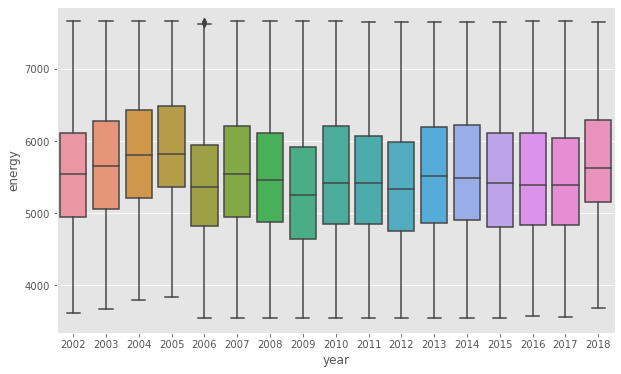

In [19]:
plt.figure(figsize=(10,6))
sns.boxplot(x=data_1.year,y=data_1.energy)

<AxesSubplot:xlabel='energy'>

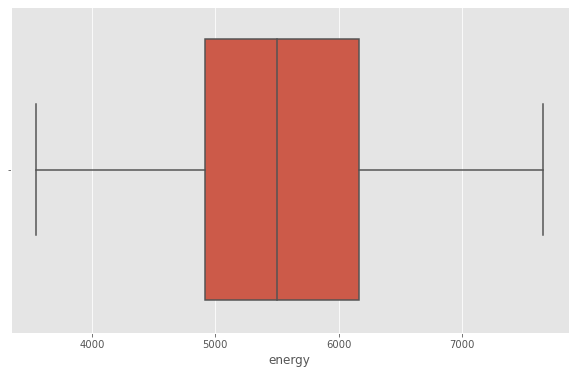

In [20]:
plt.figure(figsize=(10,6))
sns.boxplot(data_1.energy)

In [21]:
df=data_1.copy()

In [22]:
# clean data(for future )
df.to_csv('out_clean_data.csv')

###  VISUALIZATION

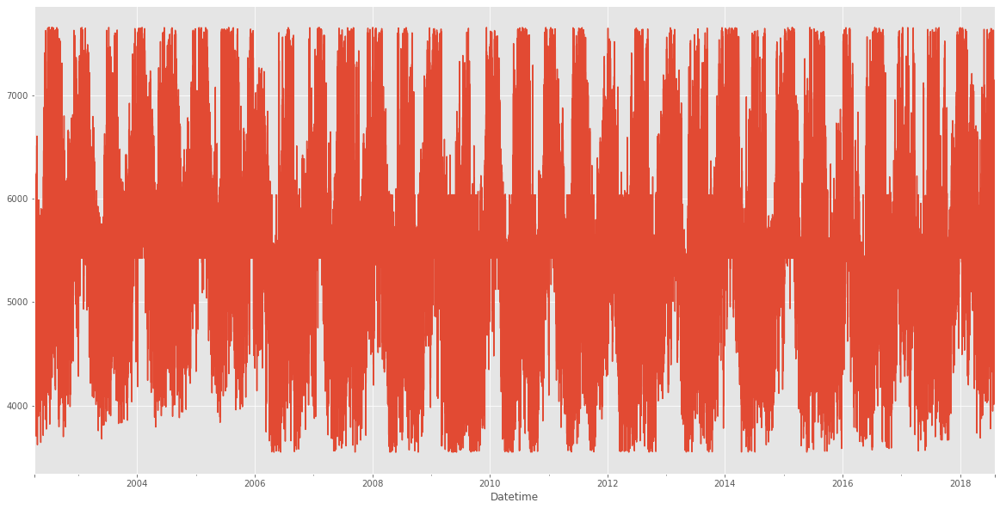

In [23]:
#energy plot
plt.figure(figsize=(20,10))
data_1['energy'].plot()
plt.show()

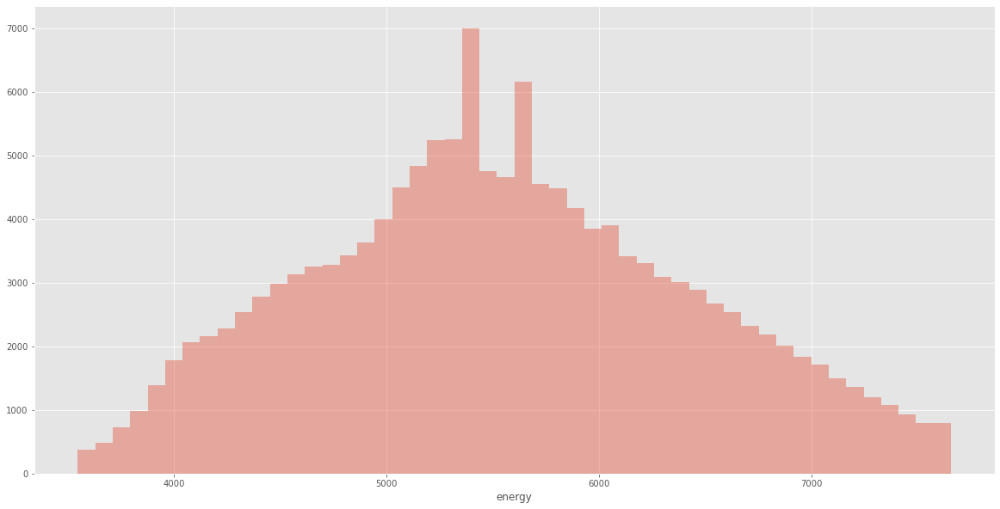

In [24]:
#let see the data is normally distributed or not
plt.figure(figsize=(20,10))
sns.distplot(data_1['energy'],kde=False)
plt.show()

In [25]:
data_1[data_1['energy']==data_1['energy'].max()]
# maximum energy consumption

,energy,date,year,month,month_name,week_of_year,quarter,day_of_week,day_of_week_name,day_of_month,day_of_year,hour,time
Datetime,,,,,,,,,,,,,
2002-07-03 20:00:00,7657.0,2002-07-03,2002,7,July,27,3,2,Wednesday,3,184,20,20:00:00
2002-07-18 16:00:00,7657.0,2002-07-18,2002,7,July,29,3,3,Thursday,18,199,16,16:00:00
2002-07-23 17:00:00,7657.0,2002-07-23,2002,7,July,30,3,1,Tuesday,23,204,17,17:00:00
2003-01-22 18:00:00,7657.0,2003-01-22,2003,1,January,4,1,2,Wednesday,22,22,18,18:00:00
2003-07-08 19:00:00,7657.0,2003-07-08,2003,7,July,28,3,1,Tuesday,8,189,19,19:00:00
2004-01-31 19:00:00,7657.0,2004-01-31,2004,1,January,5,1,5,Saturday,31,31,19,19:00:00
2005-07-22 13:00:00,7657.0,2005-07-22,2005,7,July,29,3,4,Friday,22,203,13,13:00:00
2007-02-06 16:00:00,7657.0,2007-02-06,2007,2,February,6,1,1,Tuesday,6,37,16,16:00:00
2008-01-04 07:00:00,7657.0,2008-01-04,2008,1,January,1,1,4,Friday,4,4,7,07:00:00


In [26]:
data_1[data_1['energy']==data_1['energy'].min()]
#minimum energy consumptiom

,energy,date,year,month,month_name,week_of_year,quarter,day_of_week,day_of_week_name,day_of_month,day_of_year,hour,time
Datetime,,,,,,,,,,,,,
2008-05-26 06:00:00,3548.0,2008-05-26,2008,5,May,22,2,0,Monday,26,147,6,06:00:00


### Minimum Energy consumed  3548.0 PJMW_MW
### Maximum Energy Consumed 7657.0 PJMW_MW 

#### TO KNOW HOW MANY YEARS ARE THERE

In [27]:
print(data_1.year.unique())
print('we have a data from 2002 to 2018')

[2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015
 2016 2017 2018]
we have a data from 2002 to 2018


#### LET SEE  THE RELATION BTW ENERGY CONSUMPTION VS YEAR

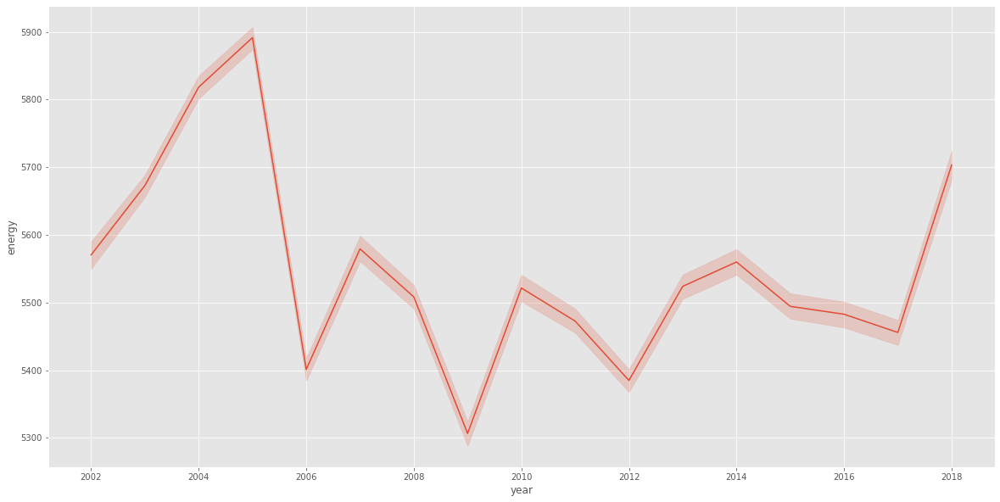

In [28]:
# on yearly basis
plt.figure(figsize=(20,10))
sns.lineplot(x=data_1['year'],y=data_1['energy'])
plt.show()

In [29]:
data_1['year'].isnull().sum()

0

### BIVARIATE PLOTS
### To know the best fit line we will plot the regression  

<Figure size 720x432 with 0 Axes>

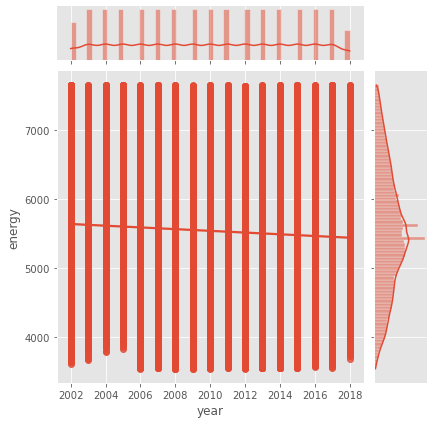

In [30]:
plt.figure(figsize=(10,6))
sns.jointplot(x='year',y='energy',data=data_1,kind='reg')
plt.show()

### find the kernal density to estimate where the data has most concentration

<Figure size 720x432 with 0 Axes>

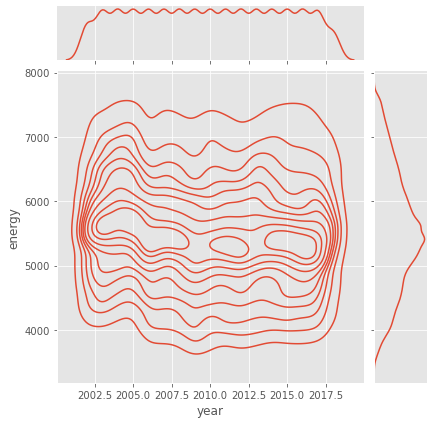

In [31]:
plt.figure(figsize=(10,6))
sns.jointplot(x='year',y='energy',data=data_1,kind='kde')
plt.show()

### Monthly Energy Consumption

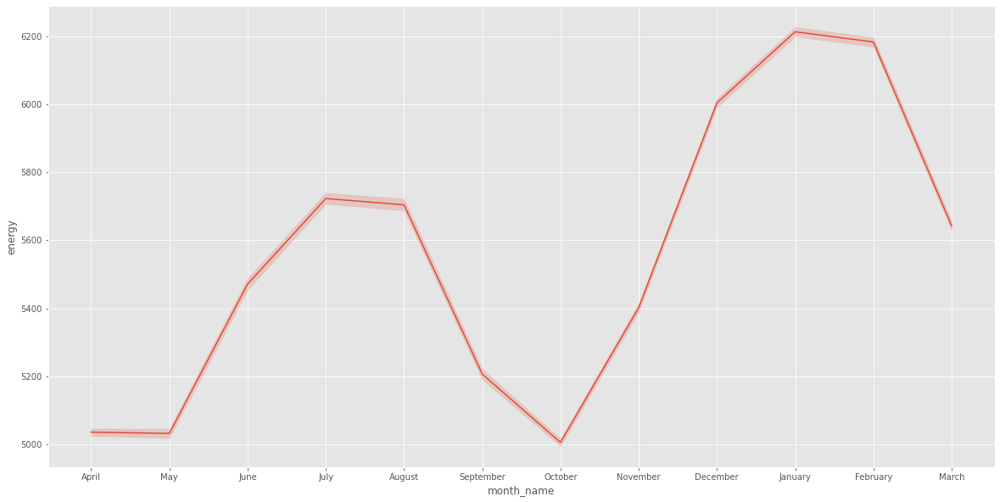

In [32]:
# for more better view 
plt.figure(figsize=(20,10))
sns.lineplot(x='month_name',y='energy',data=data_1)
plt.show()

In [33]:
data_1['month'].isnull().sum()

0

### Day Energy consumption 

<AxesSubplot:xlabel='day_of_week_name', ylabel='energy'>

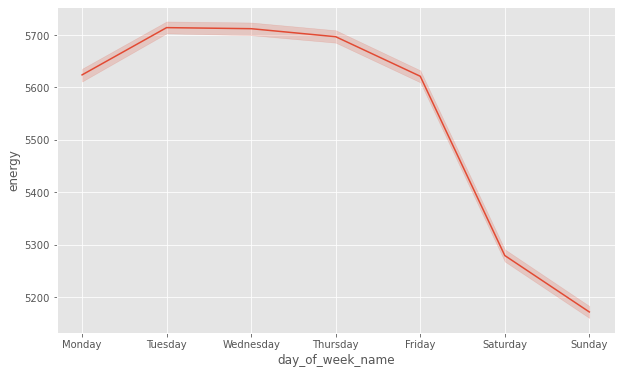

In [34]:
plt.figure(figsize=(10,6))
sns.lineplot(x='day_of_week_name',y='energy',data=data_1)

In [35]:
data_1['day_of_week_name'].isnull().sum()

0

### Holidays Energy Consumption 

In [36]:
pip install holidays

Note: you may need to restart the kernel to use updated packages.


In [37]:
import holidays

In [38]:
a=holidays.US()

In [39]:
data_1['holidays'] = data_1.date.apply( lambda x: 'holiday' if x in a else 'normal_day' )

In [40]:
data_1['holidays'].value_counts()

normal_day    138912
holiday         4320
Name: holidays, dtype: int64

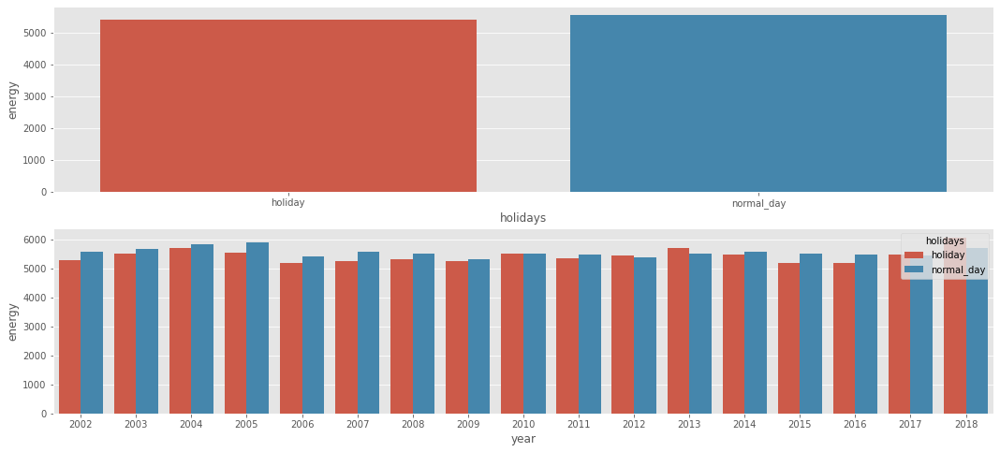

In [41]:
plt.figure(figsize=(18,8))

aux1 = data_1[['holidays', 'energy']].groupby( 'holidays' ).mean().reset_index()
plt.subplot( 2, 1, 1 )
sns.barplot( x='holidays', y='energy', data=aux1)

aux2 = data_1[['year', 'holidays', 'energy']].groupby( ['year', 'holidays'] ).mean().reset_index()
plt.subplot( 2, 1, 2 )
sns.barplot( x='year', y='energy', hue='holidays', data=aux2 );

In [42]:
data_1.holidays.isna().sum()

0

In [43]:
data_1['holidays'].max()

'normal_day'

### Check the relation  between hour ,day and energy

<AxesSubplot:title={'center':'Energy Consumption'}, xlabel='hour'>

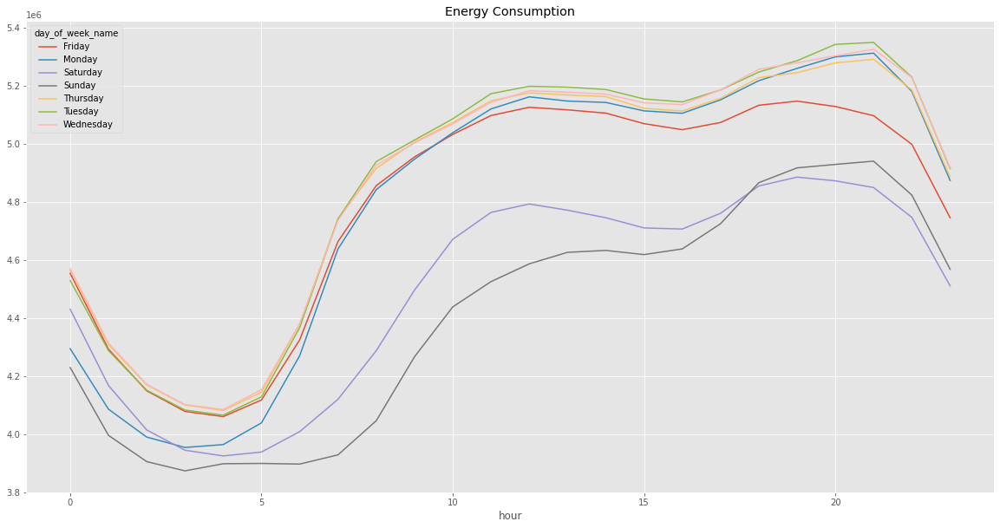

In [44]:
data_1.pivot_table(index=data_1['hour'],
                   columns='day_of_week_name',
                   values='energy',
                   aggfunc='sum').plot(figsize=(20,10),
                                      title='Energy Consumption')

### Date Energy Consumptions 

#### Time Series

In [45]:
fig=px.line(data_1,x=data_1.index,y=data_1.energy)
fig.update_layout(title='Energy Consumption ',
                 xaxis_title='Energy',
                 yaxis_title='date',
                 xaxis_rangeslider_visible=True,)
fig.show()

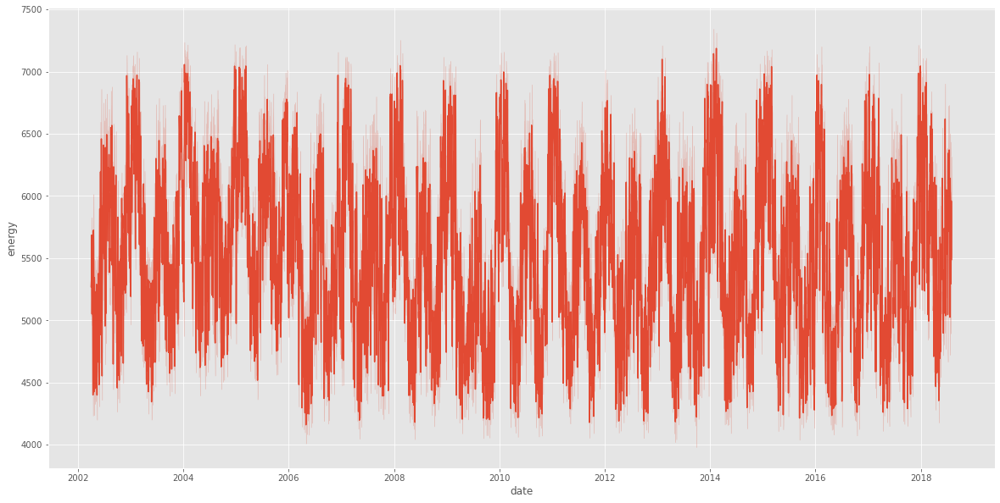

In [46]:
# let see the pattern also
plt.figure(figsize=(20,10))
sns.lineplot(x='date',y='energy',data=data_1)
plt.show()

### Season Energy Consumption

In [47]:
# Extracting season 
def season(month):
    if (month == 12 or 1 <= month <= 4):
        return "winter"   
    elif (4 <= month <= 5):
        return "spring" 
    elif (6 <= month <= 9):
        return "summer"
    else:
        return "fall"

In [48]:
data_1['season']=data_1.month.apply(season)
data_1

,energy,date,year,month,month_name,week_of_year,quarter,day_of_week,day_of_week_name,day_of_month,day_of_year,hour,time,holidays,season
Datetime,,,,,,,,,,,,,,,
2002-04-01 01:00:00,4374.0,2002-04-01,2002,4,April,14,2,0,Monday,1,91,1,01:00:00,normal_day,winter
2002-04-01 02:00:00,4306.0,2002-04-01,2002,4,April,14,2,0,Monday,1,91,2,02:00:00,normal_day,winter
2002-04-01 03:00:00,4322.0,2002-04-01,2002,4,April,14,2,0,Monday,1,91,3,03:00:00,normal_day,winter
2002-04-01 04:00:00,4359.0,2002-04-01,2002,4,April,14,2,0,Monday,1,91,4,04:00:00,normal_day,winter
2002-04-01 05:00:00,4436.0,2002-04-01,2002,4,April,14,2,0,Monday,1,91,5,05:00:00,normal_day,winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-02 20:00:00,6545.0,2018-08-02,2018,8,August,31,3,3,Thursday,2,214,20,20:00:00,normal_day,summer
2018-08-02 21:00:00,6496.0,2018-08-02,2018,8,August,31,3,3,Thursday,2,214,21,21:00:00,normal_day,summer
2018-08-02 22:00:00,6325.0,2018-08-02,2018,8,August,31,3,3,Thursday,2,214,22,22:00:00,normal_day,summer


In [49]:
data_1.season.isnull().sum()

0

In [50]:
data_1['season'].value_counts()

winter    58799
summer    48361
fall      23424
spring    12648
Name: season, dtype: int64

<AxesSubplot:xlabel='year', ylabel='energy'>

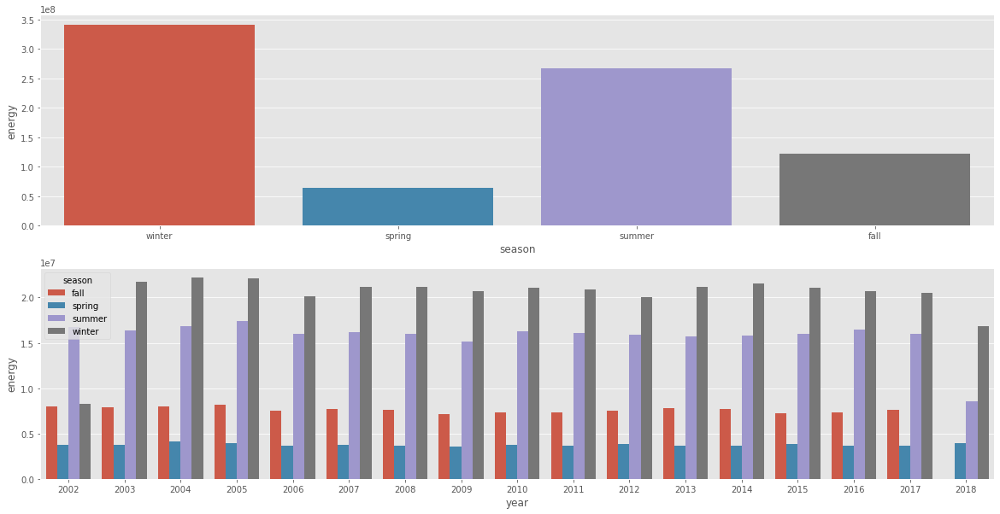

In [51]:
plt.figure(figsize=(20,10))
aux1 = data_1[['season', 'energy']].groupby( 'season' ).sum().reset_index()
plt.subplot( 2, 1, 1 )
sns.barplot( x='season', y='energy', data=aux1, order=['winter', 'spring', 'summer', 'fall'] )

aux2 = data_1[['year', 'season', 'energy']].groupby( ['year', 'season'] ).sum().reset_index()
plt.subplot( 2, 1, 2 )
sns.barplot( x='year', y='energy', hue='season', data=aux2 )


<AxesSubplot:xlabel='season', ylabel='energy'>

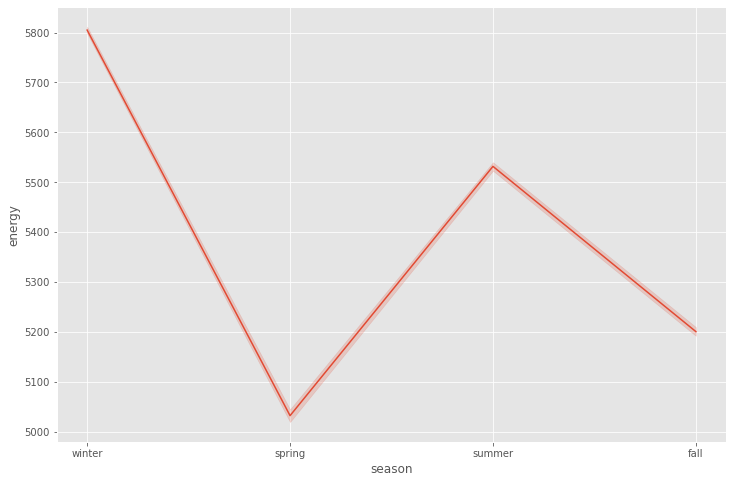

In [52]:
sns.lineplot(x='season',y='energy',data=data_1)

### let see relation between hourly , seasonal and energy

<AxesSubplot:title={'center':'seasonal consumption'}, xlabel='hour'>

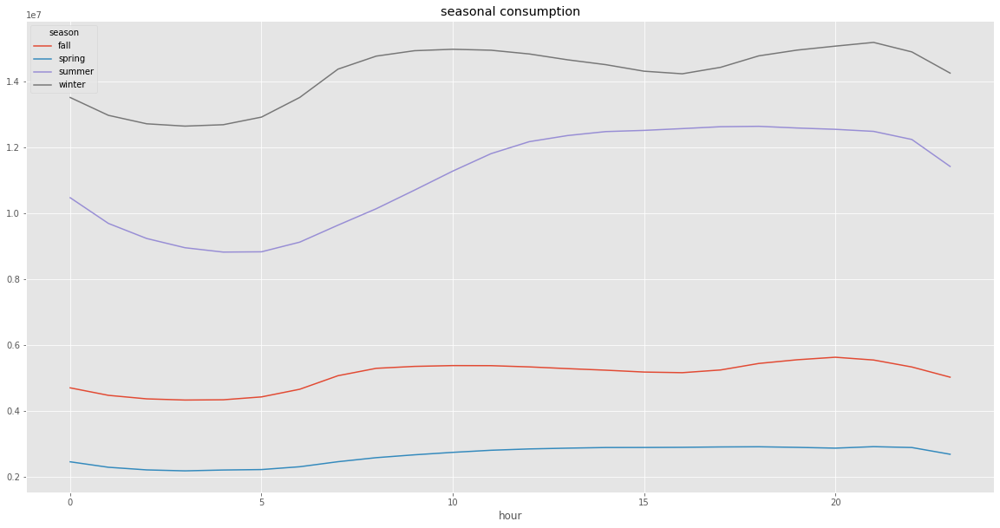

In [53]:
data_1.pivot_table(index='hour',
                  columns='season',
                  values='energy',
                  aggfunc='sum').plot(figsize=(20,10),
                                 title='seasonal consumption')

### Weekly Energy Consumption 

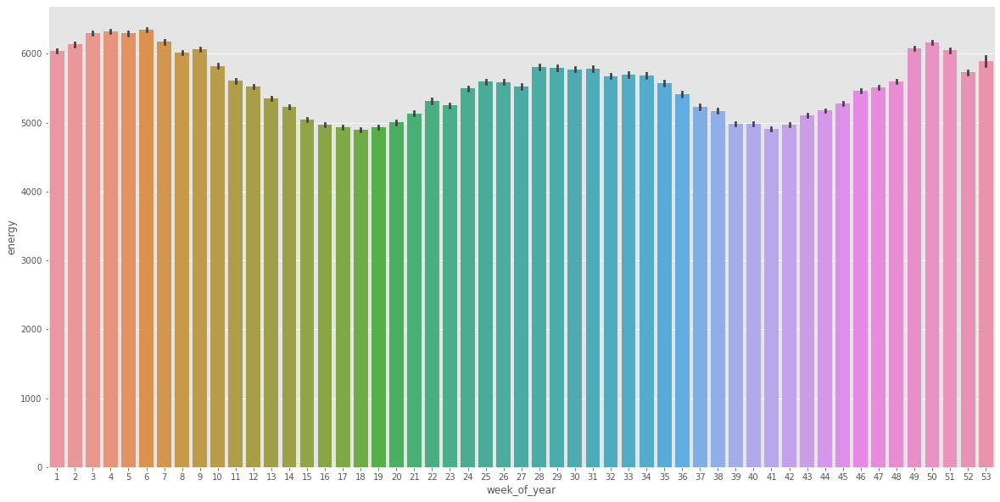

In [54]:
plt.figure(figsize=(20,10))
sns.barplot(x='week_of_year',y='energy',data=data_1)
plt.show()

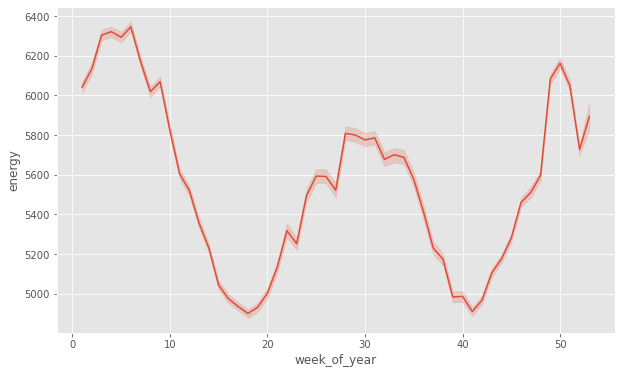

In [55]:
# look at the pattern
plt.figure(figsize=(10,6))
sns.lineplot(x='week_of_year',y='energy',data=data_1)
plt.show()

### Hourly Energy Consumption

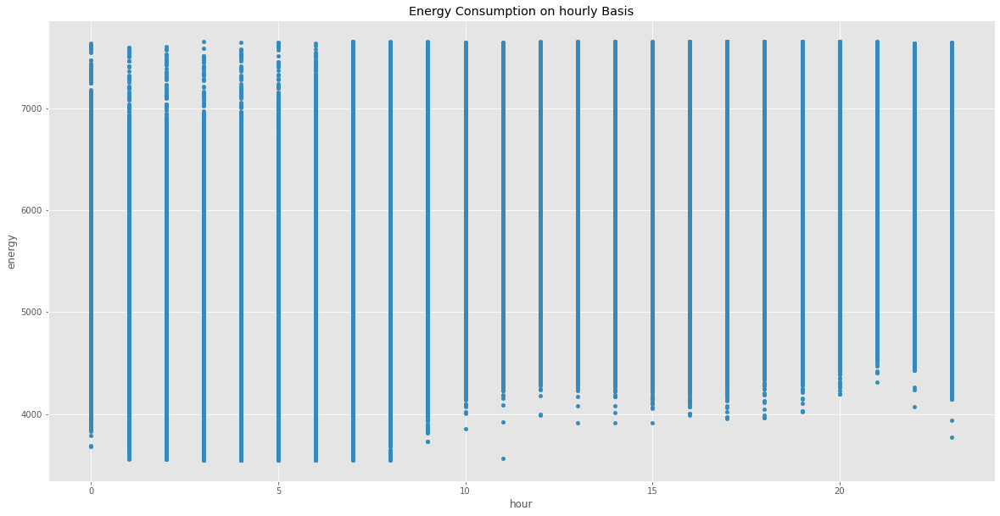

In [56]:
data_1[['energy','hour']].plot(x='hour',
                              y='energy',
                              title='Energy Consumption on hourly Basis',
                              kind='scatter',
                              figsize=(20,10))
plt.show()

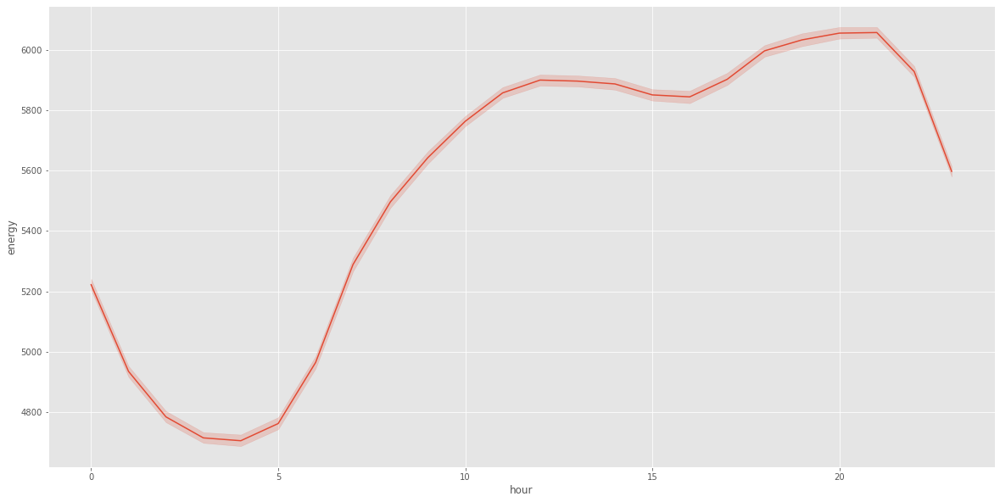

In [57]:
# let see hourly pattern 
plt.figure(figsize=(20,10))
sns.lineplot(x='hour',y='energy',data=data_1)
plt.show()

### PLotly subplots grouped dataframes

In [58]:
# plotly is a graphic library for interactive and publication quality graph 
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# creating a grouped dataframe in orde to analyze them together
df_year=data_1.groupby('year')['energy'].sum()
df_date=data_1.groupby('date')['energy'].sum()
df_time=data_1.groupby('time')['energy'].sum()
df_month=data_1.groupby('month_name',sort=False)['energy'].sum()
df_week=data_1.groupby('week_of_year',sort=False)['energy'].sum()
df_day=data_1.groupby('day_of_week_name')['energy'].sum()
df_hourly=data_1.groupby('hour')['energy'].sum()
df_quarter=data_1.groupby('quarter')['energy'].sum()
df_season=data_1.groupby('season')['energy'].sum()

In [59]:
# creating a partly subplots
from plotly.subplots import make_subplots
fig=make_subplots(rows=4,cols=2,vertical_spacing=0.190,
                  subplot_titles=(['Year',  'date', 'Month', 'week_of_year', 'time', 'day_of_week_name','Quarter','season']))
fig.add_trace(go.Scatter(x=df_year.index,y=df_year),row=1,col=1)
fig.add_trace(go.Scatter(x=df_date.index,y=df_date),row=1,col=2)
fig.add_trace(go.Scatter(x=df_time.index,y=df_time),row=3,col=1)
fig.add_trace(go.Scatter(x=df_month.index,y=df_month),row=2,col=1)
fig.add_trace(go.Scatter(x=df_week.index,y=df_week),row=2,col=2)
fig.add_trace(go.Scatter(x=df_day.index,y=df_day),row=3,col=2)
fig.add_trace(go.Scatter(x=df_hourly.index,y=df_hourly),row=4,col=1)
fig.add_trace(go.Scatter(x=df_quarter.index,y=df_quarter),row=4,col=2)


fig.update_layout(title='ENERGY CONSUMPTION AS PER ',height=700,width=850,showlegend=False)

fig.show()

### ANALYSING RESULTS:

### [ ii  ] TIME SERIES ANALYSIS : 

let's analyze 2 main aspects of time series: Seasonality & Stationarity

## Seasonality 

#### Yearly Trend

In [63]:
from statsmodels.tsa.seasonal import seasonal_decompose

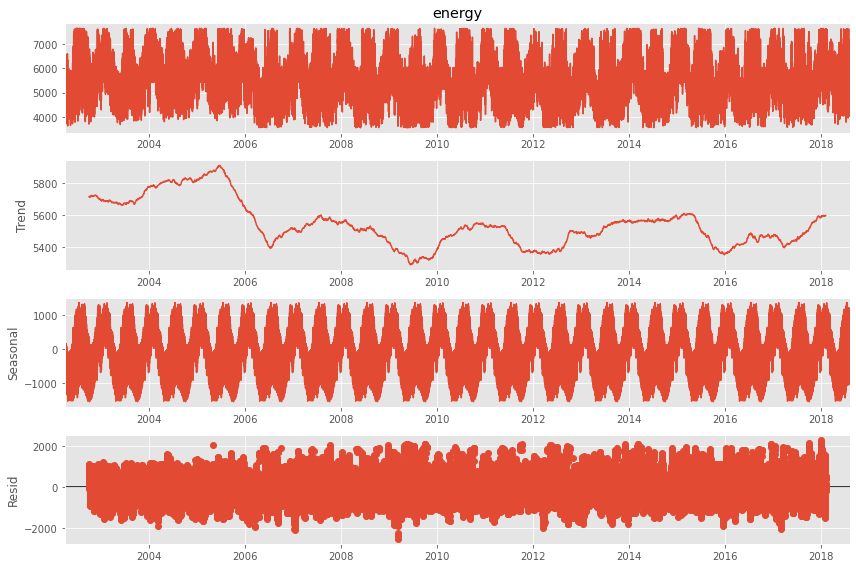

In [66]:
# Additive seasonality
year=seasonal_decompose(data_1.energy,period=365*24)
year.plot()
plt.show()

### Seasonal Trend 

In [71]:
season=data_1.groupby('season').agg({"energy":'mean'}).reset_index()

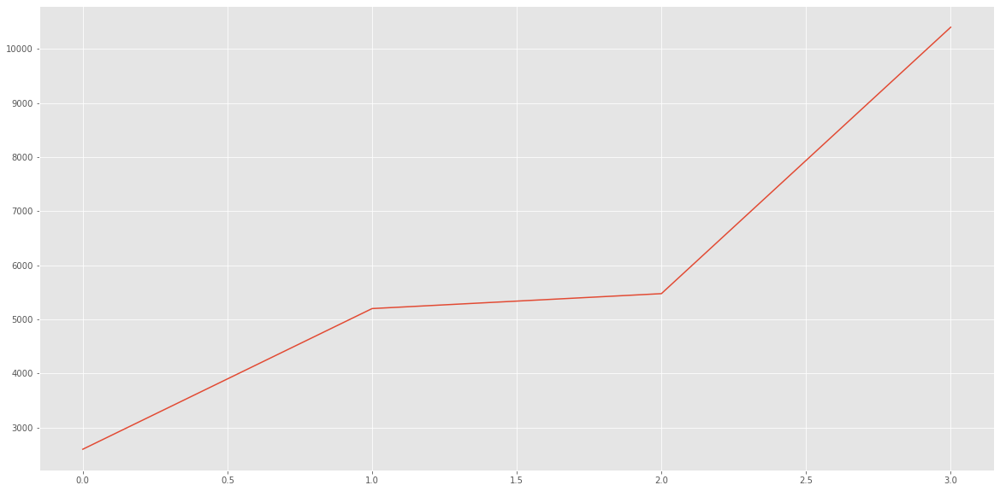

In [72]:
season_t=sm.tsa.seasonal_decompose(season.energy,model='multiplicative',extrapolate_trend='freq',period=2)
with plt.rc_context():
    plt.rc('figure',figsize=(20,10))
    season_t.trend.plot()
    plt.show()

#### Hourly Trend

In [67]:
hour=data_1.groupby('hour').agg({'energy':'mean'}).reset_index()

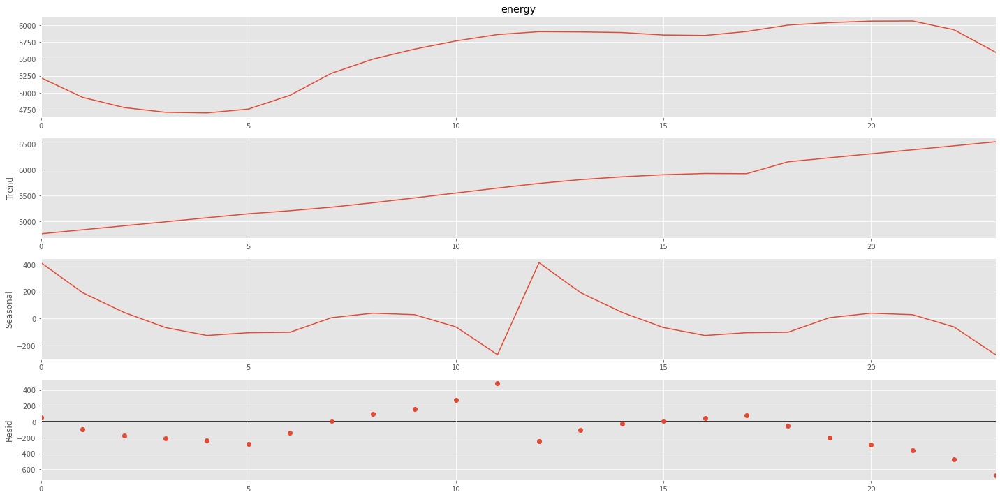

In [70]:
seasonal=sm.tsa.seasonal_decompose(hour.energy,extrapolate_trend='freq',period=12)
with plt.rc_context():
    plt.rc('figure',figsize=(20,10))
    seasonal.plot()
    plt.show()


### Holiday Trend

In [73]:
data_1['holidays']=data_1['holidays'].replace({'normal_day':0,'holiday':1})
data_1['holidays'].value_counts()
# o normal day
# 1 holiday

0    138912
1      4320
Name: holidays, dtype: int64

In [74]:
holiday=data_1.groupby('holidays').agg({'energy':'mean'}).reset_index()

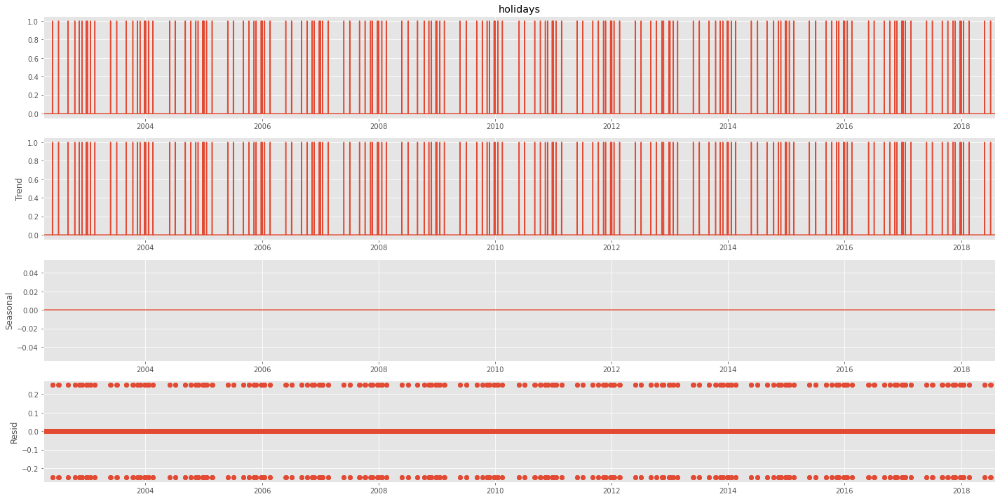

In [77]:
hol=seasonal_decompose(data_1['holidays'],period=2)
with plt.rc_context():
    plt.rc('figure',figsize=(20,10))
    hol.plot()
    plt.show()

### Monthly Trend/Seasonality

In [78]:
month=data_1.groupby('month').agg({'energy':'mean'}).reset_index()

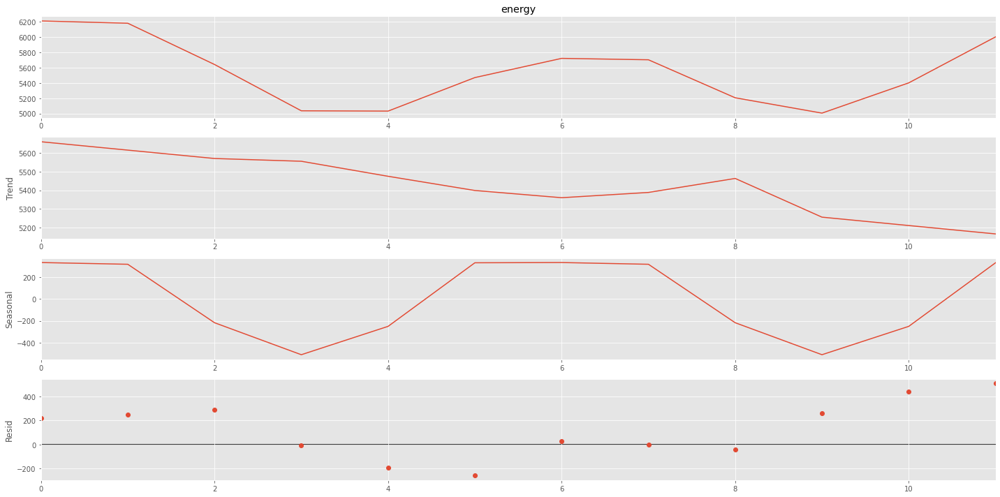

In [79]:
month_seas1=sm.tsa.seasonal_decompose(month.energy,extrapolate_trend='freq',period=6)
with plt.rc_context():
    plt.rc('figure',figsize=(20,10))
    month_seas1.plot()
    plt.show()


### Day Trend/Seasonality

In [80]:
day=data_1.groupby('day_of_week_name').agg({'energy':'mean'}).reset_index()

In [81]:
#### mulitplicative and additive both are showing the same pattern so we will take multiplicative here

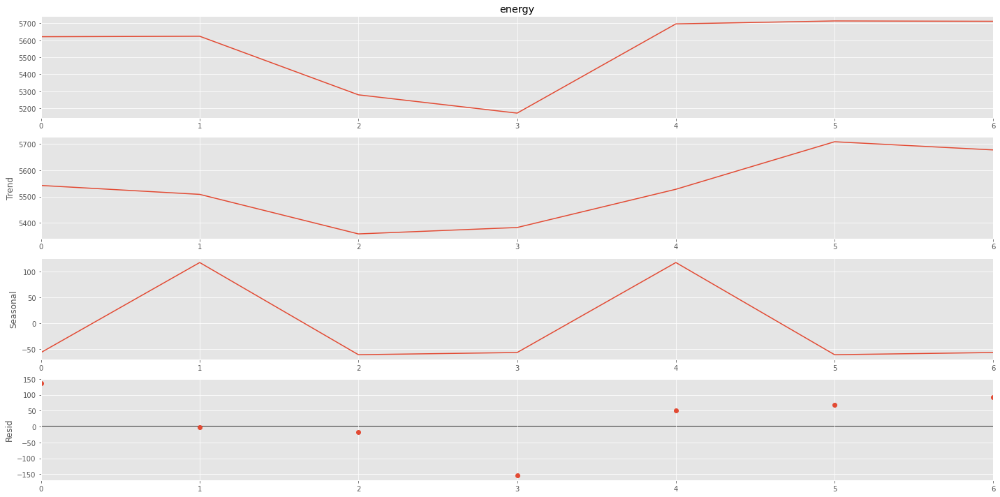

In [84]:
dayseas1=sm.tsa.seasonal_decompose(day.energy,extrapolate_trend='freq',period=3)
with plt.rc_context():
    plt.rc('figure',figsize=(20,10))
    dayseas1.plot()
    plt.show()

### Lag Plot 

Lag Plot is used to help evaluate whether the data and time series is random or not .

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 1)'>

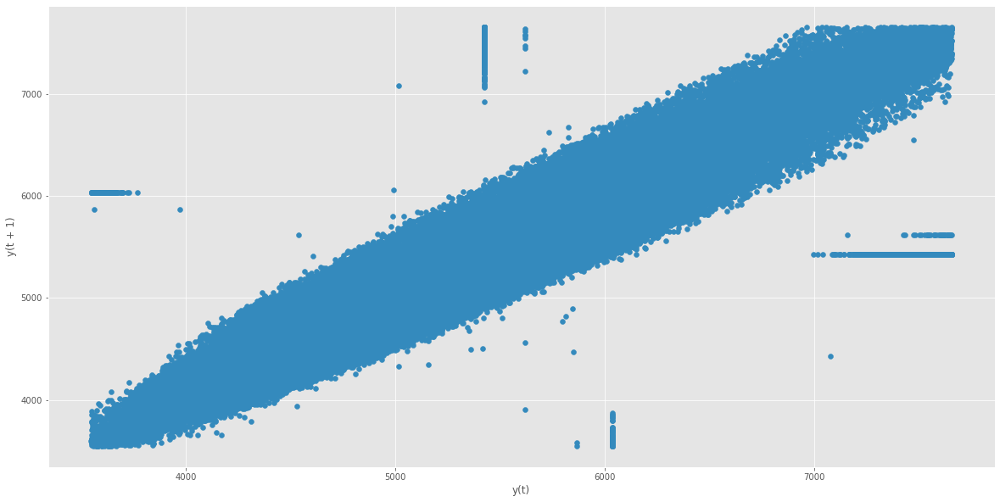

In [85]:
plt.figure(figsize=(20,10))
pd.plotting.lag_plot(data_1.energy)

In [86]:
data_1

,energy,date,year,month,month_name,week_of_year,quarter,day_of_week,day_of_week_name,day_of_month,day_of_year,hour,time,holidays,season
Datetime,,,,,,,,,,,,,,,
2002-04-01 01:00:00,4374.0,2002-04-01,2002,4,April,14,2,0,Monday,1,91,1,01:00:00,0,winter
2002-04-01 02:00:00,4306.0,2002-04-01,2002,4,April,14,2,0,Monday,1,91,2,02:00:00,0,winter
2002-04-01 03:00:00,4322.0,2002-04-01,2002,4,April,14,2,0,Monday,1,91,3,03:00:00,0,winter
2002-04-01 04:00:00,4359.0,2002-04-01,2002,4,April,14,2,0,Monday,1,91,4,04:00:00,0,winter
2002-04-01 05:00:00,4436.0,2002-04-01,2002,4,April,14,2,0,Monday,1,91,5,05:00:00,0,winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-02 20:00:00,6545.0,2018-08-02,2018,8,August,31,3,3,Thursday,2,214,20,20:00:00,0,summer
2018-08-02 21:00:00,6496.0,2018-08-02,2018,8,August,31,3,3,Thursday,2,214,21,21:00:00,0,summer
2018-08-02 22:00:00,6325.0,2018-08-02,2018,8,August,31,3,3,Thursday,2,214,22,22:00:00,0,summer


In [87]:
# saving a cleaned data 
data_1.to_csv('data.csv')